In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline

In [5]:
def planet_1(m1,m2,msun,r12,rsun,theta2_sine,theta2_cosine,thetasun_sine,thetasun_cosine,dt,v0x,v0y):
    def gravity_sun(msun,m1,rsun):
        #https://physics.nist.gov/cgi-bin/cuu/Value?bg
        G = 6.67430*(10**-11)
        return(-G*msun*m1/(rsun**2))
    def gravity_m2(m2,m1,r12):
        #https://physics.nist.gov/cgi-bin/cuu/Value?bg
        G = 6.67430*(10**-11)
        return(-G*m2*m1/(r12**2))
    def fx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        gsun = gravity_sun(msun,m1,rsun)
        gm2 = gravity_m2(m2,m1,r12)
        return(thetasun_cosine*gsun + theta2_sine*gm2)
    def fy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        gsun = gravity_sun(msun,m1,rsun)
        gm2 = gravity_m2(m2,m1,r12)
        return((thetasun_sine)*gsun + theta2_cosine*gm2)
    def ax(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        return(fx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)/m1)
    def ay(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        return(fy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)/m1)
    def vx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0x):
        return(ax(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)*dt+v0x)
    def vy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0y):
        return(ay(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)*dt+v0y)
    return(gravity_sun(msun,m1,rsun),gravity_m2(m2,m1,r12),fx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),
          fy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),ax(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),
          ay(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),vx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0x),
          vy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0y))
    

In [6]:
def planet_2(m1,m2,msun,r12,rsun,theta2_sine,theta2_cosine,thetasun_sine,thetasun_cosine,dt,v0x,v0y):
    def gravity_sun(msun,m2,rsun):
        #https://physics.nist.gov/cgi-bin/cuu/Value?bg
        G = 6.67430*(10**-11)
        return(-G*msun*m2/(rsun**2))
    def gravity_m1(m1,m2,r12):
        #https://physics.nist.gov/cgi-bin/cuu/Value?bg
        G = 6.67430*(10**-11)
        return(-G*m1*m2/(r12**2))
    def fx(m1,m2,msun,r1,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        gsun = gravity_sun(msun,m2,rsun)
        gm2 = gravity_m1(m1,m2,r12)
        return(thetasun_cosine*gsun + theta2_sine*gm2)
    def fy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        gsun = gravity_sun(msun,m2,rsun)
        gm2 = gravity_m1(m1,m2,r12)
        return(thetasun_sine*gsun + theta2_cosine*gm2)
    def ax(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        return(fx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)/m2)
    def ay(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine):
        return(fy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)/m2)
    def vx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0x):
        return(ax(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)*dt+v0x)
    def vy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0y):
        return(ay(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine)*dt+v0y)
    return(gravity_sun(msun,m2,rsun),gravity_m1(m2,m1,r12),fx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),
          fy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),ax(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),
          ay(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine),vx(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0x),
          vy(m1,m2,msun,r12,rsun,thetasun_sine,thetasun_cosine,theta2_sine,theta2_cosine,dt,v0y))
    

In [20]:
def initial_parameters_p1_p2():
    
    i = 10000
    
    p1_pos = [0,149.6*(10**9)]
#     p2_pos = [0,227.9*(10**9)]
    p2_pos = [0, 108.2*(10**9)]
    p3_pos = [0,778.8*10**(9)]
    m1 = 5.97*(10**24)
#     m2 = 0.642*(10**24)
    m2 = 4.87*10**24
    m3 = 1898*10**24
    msun = 1988500*(10**24)

    x12 = p1_pos[0]-p2_pos[0]
    y12 = p1_pos[1]-p2_pos[1]
    rsun_1 = np.sqrt((p1_pos[0]**2) + (p1_pos[1]**2))
    rsun_2 = np.sqrt((p2_pos[0]**2) + (p2_pos[1]**2))
    r12 = np.sqrt((x12**2)+(y12**2)) 

    thetasun_sine_p1 = 1
    thetasun_cosine_p1 = 0
    thetasun_sine_p2 = 1
    thetasun_cosine_p2 = 0
    theta2_sine_p1 = 0
    theta2_cosine_p1 = 1
    theta2_sine_p2 = 0
    theta2_cosine_p2 = 1
    
    
#     dt = 3.1536*(10**7)/i
    dt = 687*24*60*60/i
#     dt = 687*(10**7)/50000
    v0y_1 = 0
    v0x_1 = 29.8*(10**3)
    v0y_2 = 0
#     v0x_2 = 24.1*(10**3)
    v0x_2 = 35 * 10**3
#     v0x_2 = 13.1*10**3
    return(i,p1_pos,p2_pos,m1,m2,msun,r12,rsun_1,rsun_2,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2
           ,thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,thetasun_cosine_p2,dt,v0x_1,v0y_1,v0x_2,v0y_2)

In [21]:
i,p1_pos,p2_pos,m1,m2,msun,r12,rsun_1,rsun_2,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2,thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,thetasun_cosine_p2,dt,v0x_1,v0y_1,v0x_2,v0y_2 = initial_parameters_p1_p2()

def pos_update(p1_pos,p2_pos,m1,m2,msun,r12,rsun_1,rsun_2,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2
    ,thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,
    thetasun_cosine_p2,dt,v0x_1,v0y_1,v0x_2,v0y_2):
    
    sun_on_p1, p2_on_p1, net_f_x_1, net_f_y_1, ax_1, ay_1, vx_1, vy_1 = planet_1(m1,m2,msun,r12,rsun_1,theta2_sine_p1,theta2_cosine_p1,thetasun_sine_p1,thetasun_cosine_p1,dt,v0x_1,v0y_1)
    sun_on_p2, p1_on_p2, net_f_x_2, net_f_y_2, ax_2, ay_2, vx_2, vy_2 = planet_2(m1,m2,msun,r12,rsun_2,theta2_sine_p2,theta2_cosine_p2,thetasun_sine_p2,thetasun_cosine_p2,dt,v0x_2,v0y_2)
    
    p1_pos[0] = p1_pos[0] + vx_1*dt + 0.5*ax_1*(dt**2)
    p1_pos[1] = p1_pos[1] + vy_1*dt + 0.5*ay_1*(dt**2)
    p2_pos[0] = p2_pos[0] + vx_2*dt + 0.5*ax_2*(dt**2)
    p2_pos[1] = p2_pos[1] + vy_2*dt + 0.5*ay_2*(dt**2)

    #update velocity
    v0x_1 = v0x_1 + ax_1*dt
    v0y_1 = v0y_1 + ay_1*dt
    v0x_2 = v0x_2 + ax_2*dt
    v0y_2 = v0y_2 + ay_2*dt
    
    rsun_1 = np.sqrt((p1_pos[0])**2 + (p1_pos[1])**2)
    rsun_2 = np.sqrt((p2_pos[0])**2 + (p2_pos[1])**2)
    r12 = np.sqrt((p1_pos[0]-p2_pos[0])**2 + (p1_pos[1]-p2_pos[1])**2)

    #update angle
    
    theta2_sine_p1 = (p1_pos[0]-p2_pos[0])/r12
    theta2_cosine_p1 = (p1_pos[1]-p2_pos[1])/r12
    theta2_sine_p2 = (p2_pos[0]-p1_pos[0])/r12
    theta2_cosine_p2 = (p2_pos[1]-p1_pos[1])/r12
    
    thetasun_sine_p1 = p1_pos[1]/rsun_1
    thetasun_cosine_p1 = p1_pos[0]/rsun_1
    thetasun_sine_p2 = p2_pos[1]/rsun_2
    thetasun_cosine_p2 = p2_pos[0]/rsun_2

    return(p1_pos,p2_pos,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2,
           thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,thetasun_cosine_p2,
           v0x_1,v0y_1,v0x_2,v0y_2,ay_1,ay_2,r12,rsun_1,rsun_2,ax_1,ax_2,p1_on_p2,net_f_x_1,thetasun_sine_p1,
           thetasun_cosine_p1,sun_on_p1,net_f_y_1,ay_1)


In [22]:
i,p1_pos,p2_pos,m1,m2,msun,r12,rsun_1,rsun_2,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2,thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,thetasun_cosine_p2,dt,v0x_1,v0y_1,v0x_2,v0y_2 = initial_parameters_p1_p2()
x_1 = []
y_1 = []
x_2 = []
y_2 = []
fx = []
p1_p2_f_list = []
sun_f_list = []
rsun_1_list = []
ax_1_list = []
v0x_1_list = []
cos = []
sin = []
fy = []
ay_1_list = []

for a in range(i):
    p1_pos,p2_pos,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2,thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,thetasun_cosine_p2,v0x_1,v0y_1,v0x_2,v0y_2,ay_1,ay_2,r12,rsun_1,rsun_2,ax_1,ax_2,p1_on_p2,net_f_x_1,sine,cosine,sun_on_p1,net_f_y_1,ay_1 = pos_update(p1_pos,p2_pos,m1,m2,msun,r12,rsun_1,rsun_2,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2,thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,thetasun_cosine_p2,dt,v0x_1,v0y_1,v0x_2,v0y_2)        
    fx.append(net_f_x_1)
    fy.append(net_f_y_1)
    p1_p2_f_list.append(p1_on_p2)
    ax_1_list.append(ax_1)
    ay_1_list.append(ay_1)
    v0x_1_list.append(v0x_1)
    rsun_1_list.append(rsun_1)
    
    sun_f_list.append(sun_on_p1)
    cos.append(cosine)
    sin.append(sine)
    
    x_1.append(p1_pos[0])
    x_2.append(p2_pos[0])
    y_1.append(p1_pos[1])
    y_2.append(p2_pos[1])
    

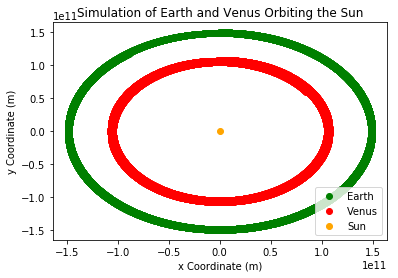

In [23]:
x_test_list = np.linspace(0,50000,50000)

# plt.scatter(x_test_list, sin)
# plt.scatter(x_test_list, rsun_1_list)
# print(min(ax_1_list)*3.1536*(10**7))
# print(max(v0x_1_list))
# print(x_1[0])
# print(v0x_1_list[0])

plt.scatter(x_1,y_1,color = 'g',label = 'Earth')
plt.scatter(x_2,y_2,color = 'r',label = 'Venus')
plt.scatter(0,0,color = 'orange',label = 'Sun')
plt.title('Simulation of Earth and Venus Orbiting the Sun')
plt.ylabel('y Coordinate (m)')
plt.xlabel('x Coordinate (m)')
plt.legend(loc = 'lower right')
plt.show()



# plt.scatter(x_test_list,ay_1_list)
# plt.scatter(x_test_list,fx)
# plt.scatter([250]*len(fx),fx)
# plt.scatter(x_test_list,[0]*len(fx))
# fx[999]


# print(v0x_1_list[0]-v0x_1_list[499])

In [122]:
fig, ax = plt.subplots()
ax.set_xscale('linear')
ax.set_yscale('linear')
plt.close(fig)

In [123]:
def anim_p1(i):
    pos_p1 = ax.scatter(x_1[i],y_1[i])
    pos_p2 = ax.scatter(x_2[i],y_2[i])
    return(pos_p1,pos_p2)

In [124]:
animation_p1 = animation.FuncAnimation(fig,anim_p1, frames = len(x_1)-1, blit = False)

In [125]:
p1_pos,p2_pos,m1,m2,msun,r12,rsun_1,rsun_2,theta2_sine_p1,theta2_cosine_p1,theta2_sine_p2,theta2_cosine_p2,thetasun_sine_p1,thetasun_cosine_p1,thetasun_sine_p2,thetasun_cosine_p2,dt,v0x_1,v0y_1,v0x_2,v0y_2 = initial_parameters_p1_p2()
HTML(animation_p1.to_jshtml())

In [51]:
p1_pos,p2_pos,m1,m2,msun,r12,rsun_1,theta2,thetasun_1,dt,v0x,v0y = initial_parameters_p1()
sun_on_p1, p2_on_p1, net_f_x_1, net_f_y_1, ax_1, ay_1, vx_1, vy_1 = planet_1(m1,m2,msun,r12,rsun_1,theta2,thetasun_1,dt,v0x,v0y)

ValueError: too many values to unpack (expected 12)

In [71]:
print(ay_1*3.154*(10**7)/4)

-0.055108542529714276


In [79]:

print(net_f_x_1)
print(m1)
print(ax_1*3.154*(10**7))

-1.2923558885170013e+23
5.969999999999999e+24
-682762.2231796688
